In [1]:
import os
import sys
from typing import Optional, Union, Callable, Tuple

import chex
import e3nn_jax as e3nn
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import optax
import plotly
import plotly.graph_objects as go
import plotly.subplots as sp
from plotly.subplots import make_subplots

# Add src directory to path
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
src_dir = os.path.join(project_root, 'src')
sys.path.append(src_dir)

from utils.plotters import visualize_geometry, colorplot, visualize_signal
from utils.geometries import trigonal_plane, tetrahedron, octahedron
from utils.alignment import align_signals, find_best_random_quaternion, rotate_points_quaternion, stack_points, point_distance, spherical_harmonic_distance
import spectra
from spectra import sum_of_diracs, powerspectrum, bispectrum, trispectrum

# Enable 64-bit precision
jax.config.update("jax_enable_x64", True)

def powerspectrum_without_pseudoscalars(x: e3nn.IrrepsArray) -> e3nn.IrrepsArray:
    """
    Computes the power spectrum of an array of irreducible representations.

    Parameters:
        x (e3nn.IrrepsArray): Input array of irreducible representations.

    Returns:
        e3nn.IrrepsArray: The power spectrum of the input array.
    """
    rtp = e3nn.reduced_symmetric_tensor_product_basis(x.irreps, 2, keep_ir=['0e'])
    return e3nn.IrrepsArray(rtp.irreps, jnp.einsum("i,j,ijz->z", x.array, x.array, rtp.array)).array

def bispectrum_without_pseudoscalars(x: e3nn.IrrepsArray) -> e3nn.IrrepsArray:
    """
    Computes the bispectrum of an array of irreducible representations.

    Parameters:
        x (e3nn.IrrepsArray): Input array of irreps.

    Returns:
    
        e3nn.IrrepsArray: The bispectrum of the input array.
    """
    rtp = e3nn.reduced_symmetric_tensor_product_basis(x.irreps, 3, keep_ir=['0e'])
    return e3nn.IrrepsArray(rtp.irreps, jnp.einsum("i,j,k,ijkz->z", x.array, x.array, x.array, rtp.array)).array

# bispectrum = bispectrum_without_pseudoscalars
# powerspectrum = powerspectrum_without_pseudoscalars

In [2]:
degen1 = np.array([
    [ 0.00000000,  0.00000000,  0.00000000],
    [ 1.39454902,  0.00000000,  0.57793632],
    [-1.23980586,  0.63847348,  0.57793632],
    [-0.29503787, -1.36298188,  0.57793632],
    [-0.91652028,  1.05107447, -0.57793632],
    [ 0.33360178, -1.35405938, -0.57793632],
    [ 1.22118593,  0.67340320, -0.57793632],
    [ 0.00000000,  0.00000000,  1.76852686],
])

degen2 = np.array([
    [ 0.00000000,  0.00000000,  0.00000000],
    [ 1.39454902,  0.00000000,  0.57793632],
    [-1.23980586,  0.63847348,  0.57793632],
    [-0.29503787, -1.36298188,  0.57793632],
    [-0.91652028,  1.05107447, -0.57793632],
    [ 0.33360178, -1.35405938, -0.57793632],
    [ 1.22118593,  0.67340320, -0.57793632],
    [ 0.00000000,  0.00000000, -1.76852686],
])

In [3]:
visualize_geometry(4*trigonal_plane, lmax=6, show_points=True, camera_distance=0.3)

## Plotter

In [2]:
def compare_geometries(left_geometry, left_title, right_geometry, right_title, lmax=6, width=1000, height=500, show_points=False, cam_dist=0.3):
    """
    Create a side-by-side comparison of two geometries using 3D subplots.
    
    Parameters:
    -----------
    left_geometry : object
        The geometry to display in the left subplot
    left_title : str
        Title for the left subplot
    right_geometry : object
        The geometry to display in the right subplot
    right_title : str
        Title for the right subplot
    lmax : int, optional
        Maximum degree for visualizing geometries, default is 6
    width : int, optional
        Width of the figure in pixels, default is 1000
    height : int, optional
        Height of the figure in pixels, default is 500
    show_points : bool, optional
        Whether to display the geometry points as markers, default is False
        
    Returns:
    --------
    plotly.graph_objects.Figure
        The figure containing both subplots
    """
    # Create 1x2 subplot with 3D scenes
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{'type': 'scene'}, {'type': 'scene'}]],
        subplot_titles=(left_title, right_title)
    )

    # Visualize each geometry
    fig1 = visualize_geometry(left_geometry, lmax=lmax, show_points=show_points)
    fig2 = visualize_geometry(right_geometry, lmax=lmax, show_points=show_points)

    # Add traces from each figure to the subplots
    for trace in fig1.data:
        # Only set showscale if the trace has this attribute
        if hasattr(trace, 'showscale'):
            trace.showscale = False  # Remove colorbar
        fig.add_trace(trace, row=1, col=1)
    for trace in fig2.data:
        # Only set showscale if the trace has this attribute
        if hasattr(trace, 'showscale'):
            trace.showscale = False  # Remove colorbar 
        fig.add_trace(trace, row=1, col=2)

    # Common scene settings
    scene_settings = dict(
        xaxis=dict(
            title='', 
            showticklabels=False, 
            showgrid=False, 
            zeroline=False, 
            backgroundcolor='rgba(255,255,255,255)', 
            range=[-2.5, 2.5]
        ),
        yaxis=dict(
            title='', 
            showticklabels=False, 
            showgrid=False, 
            zeroline=False, 
            backgroundcolor='rgba(255,255,255,255)', 
            range=[-2.5, 2.5]
        ),
        zaxis=dict(
            title='', 
            showticklabels=False, 
            showgrid=False, 
            zeroline=False, 
            backgroundcolor='rgba(255,255,255,255)', 
            range=[-2.5, 2.5]
        ),
        bgcolor='rgba(255,255,255,255)',
        aspectmode='cube',
        camera=dict(
            eye=dict(x=cam_dist, y=cam_dist, z=cam_dist)
        )
    )

    # Update layout with settings for both scenes
    fig.update_layout(
        scene=scene_settings,
        scene2=scene_settings,
        plot_bgcolor='rgba(255,255,255,255)',
        paper_bgcolor='rgba(255,255,255,255)',
        margin=dict(l=0, r=0, t=30, b=0),  # Increased top margin for titles
        showlegend=True if show_points else False,  # Show legend if points are displayed
        width=width,
        height=height
    )

    return fig

## Inversion Functions

In [3]:
lmax = 4

# true_geometry = degen1[1:]
# true_geometry = trigonal_plane
true_geometry = octahedron
true_signal = sum_of_diracs(true_geometry, lmax)
# true_power_spectrum = powerspectrum(true_signal)
true_bispectrum = bispectrum(true_signal)

In [14]:
def invert_to_points(true_spectrum, spectrum_function, lmax, initial_points=None, initial_lr=1e-1, 
                     seed=0):
    """
    Inverts either the power spectrum or bispectrum to a signal with adaptive learning rate.
    Returns the final signal.
    
    Args:
        true_spectrum: Target spectrum to match
        spectrum_function: Either powerspectrum or bispectrum
        lmax: Maximum degree for spherical harmonics
        initial_points: Initial point locations (None for random initialization)
        initial_lr: Initial learning rate
        seed: Random seed for initialization
    """
    def loss(
        params: optax.Params, true_spectrum: chex.Array
    ) -> chex.Array:
        """Computes the loss corresponding to the current parameters."""
        predicted_signal = sum_of_diracs(params["points"], lmax)
        pred_spectrum = spectrum_function(predicted_signal)
        return optax.l1_loss(true_spectrum, pred_spectrum).mean()

    def fit(
        params: optax.Params,
        learning_rate: float,
        true_spectrum: chex.Array,
        max_iter: int = 2500,
    ):
        # Create optimizer with fixed learning rate
        optimizer = optax.adam(learning_rate=learning_rate)
        
        opt_state = optimizer.init(params)
        
        # Initialize tracking variables
        patience = 100  # Stop if no improvement after this many iterations
        
        # Track optimization progress
        min_loss = float('inf')
        no_improvement_count = 0
        
        # Save best parameters
        best_params = jax.tree_map(lambda x: x.copy(), params)
        
        # Pure function to update parameters - JIT compatible
        @jax.jit
        def step(params, opt_state, true_spectrum, step_idx):
            loss_value, grads = jax.value_and_grad(loss)(
                params, true_spectrum
            )
            updates, opt_state = optimizer.update(grads, opt_state, params)
            params = optax.apply_updates(params, updates)
            return params, opt_state, loss_value
        
        for iter in range(max_iter):
            # Pass iteration count to the step function
            params, opt_state, loss_value = step(
                params, opt_state, true_spectrum, iter
            )
            
            # Check if loss decreased
            if loss_value < min_loss:
                min_loss = loss_value
                no_improvement_count = 0
                # Save the best parameters
                best_params = jax.tree_map(lambda x: x.copy(), params)
            else:
                no_improvement_count += 1
                
            # Early stopping if no improvement for patience iterations
            if no_improvement_count >= patience:
                print(f"Stopping early at step {iter}: no improvement for {patience} iterations")
                break
                
            if iter % 100 == 0:
                print(f"step {iter}, loss: {loss_value}")

        # Return the best parameters found during optimization
        print(f"Final best loss: {min_loss}")
        return best_params
    
    if initial_points is None:
        rng = jax.random.PRNGKey(seed)
        initial_points = jax.random.normal(rng, (20, 3))
        # initial_points = trigonal_plane + 0.1*jax.random.normal(rng, (3, 3))
    init_params = {"points": initial_points}
    
    # Create optimizer with fixed learning rate
    final_params = fit(init_params, initial_lr, true_spectrum)
    
    # Return the final points
    return final_params["points"]

In [18]:
def invert_to_points(true_spectrum, spectrum_function, lmax, mask_index=None, initial_points=None, initial_lr=1e-1, 
                     seed=0, num_iterations=2500):
    """
    Inverts either the power spectrum or bispectrum to a signal with adaptive learning rate.
    Returns the final signal and history of points saved every 100 iterations.
    
    Args:
        true_spectrum: Target spectrum to match
        spectrum_function: Either powerspectrum or bispectrum
        lmax: Maximum degree for spherical harmonics
        mask_index: Index of the bispectrum component to mask in loss calculation (None to use all components)
        initial_points: Initial point locations (None for random initialization)
        initial_lr: Initial learning rate
        seed: Random seed for initialization
        num_iterations: Maximum number of iterations
        
    Returns:
        tuple: (best_points, points_history)
            - best_points: Points that achieved the lowest loss
            - points_history: Dictionary with iteration numbers as keys and points at those iterations as values
    """
    def loss(
        params: optax.Params, true_spectrum: chex.Array
    ) -> chex.Array:
        """Computes the loss corresponding to the current parameters."""
        predicted_signal = sum_of_diracs(params["points"], lmax)
        pred_spectrum = spectrum_function(predicted_signal)
        
        if mask_index is not None:
            # Create a mask that is True for all indices except the one to be masked
            mask = jnp.ones_like(true_spectrum, dtype=bool)
            mask = mask.at[mask_index].set(False)
            
            # Apply the mask to both true and predicted spectra
            masked_true = true_spectrum * mask
            masked_pred = pred_spectrum * mask
            
            # Compute MSE only on unmasked elements
            return optax.l1_loss(masked_true, masked_pred).mean()
        else:
            # Original behavior when no masking is requested
            return optax.l1_loss(true_spectrum, pred_spectrum).mean()

    def fit(
        params: optax.Params,
        learning_rate: float,
        true_spectrum: chex.Array,
        max_iter: int = num_iterations,
    ):
        # Create optimizer with fixed learning rate
        optimizer = optax.adam(learning_rate=learning_rate)
        
        opt_state = optimizer.init(params)
        
        # Initialize tracking variables
        patience = 100  # Stop if no improvement after this many iterations
        
        # Track optimization progress
        min_loss = float('inf')
        no_improvement_count = 0
        
        # Save best parameters
        best_params = jax.tree_map(lambda x: x.copy(), params)
        
        # Initialize points history dictionary
        points_history = {}
        
        # Pure function to update parameters - JIT compatible
        @jax.jit
        def step(params, opt_state, true_spectrum, step_idx):
            loss_value, grads = jax.value_and_grad(loss)(
                params, true_spectrum
            )
            updates, opt_state = optimizer.update(grads, opt_state, params)
            params = optax.apply_updates(params, updates)
            return params, opt_state, loss_value
        
        for iter in range(max_iter):
            # Pass iteration count to the step function
            params, opt_state, loss_value = step(
                params, opt_state, true_spectrum, iter
            )
            
            # Save points every 50 iterations
            if iter % 50 == 0:
                # We need to convert JAX arrays to numpy arrays for the history
                points_history[iter] = jax.device_get(params["points"])
                print(f"step {iter}, loss: {loss_value}")
            
            # Check if loss decreased
            if loss_value < min_loss:
                min_loss = loss_value
                no_improvement_count = 0
                # Save the best parameters
                best_params = jax.tree_map(lambda x: x.copy(), params)
            else:
                no_improvement_count += 1
                
            # Early stopping if no improvement for patience iterations
            if no_improvement_count >= patience:
                print(f"Stopping early at step {iter}: no improvement for {patience} iterations")
                # Save the final points before breaking
                if iter % 100 != 0:  # Only if we haven't just saved them
                    points_history[iter] = jax.device_get(params["points"])
                break

        # Return the best parameters found during optimization
        print(f"Final best loss: {min_loss}")
        return best_params, points_history
    
    if initial_points is None:
        rng = jax.random.PRNGKey(seed)
        initial_points = jax.random.normal(rng, (20, 3))
        # initial_points = trigonal_plane + 0.1*jax.random.normal(rng, (3, 3))
    init_params = {"points": initial_points}
    
    # Create optimizer with fixed learning rate
    final_params, points_history = fit(init_params, initial_lr, true_spectrum)
    
    # Return both the best points and the history of points
    return final_params["points"], points_history

In [19]:
# Identity quaternion
q = jnp.array([1.0, 0.0, 0.0, 0.0])

# Add tiny perturbation
epsilon = 1e-3
key = jax.random.PRNGKey(0)
perturbation = jax.random.uniform(key, shape=(4,), minval=-epsilon, maxval=epsilon)
q_perturbed = q + perturbation

# Normalize
q_normalized = q_perturbed / jnp.linalg.norm(q_perturbed)
print(q_normalized)


[ 9.99999503e-01 -3.00666741e-04 -2.92808017e-04  9.04818745e-04]


In [20]:
def align_and_stack_points(predicted_points, true_geometry, lmax, seed=0, initial_quaternion=None, num_iterations=2500):
    """
    Aligns the predicted points with the true geometry and stacks them.
    """
    predicted_signal = sum_of_diracs(predicted_points, lmax)
    true_signal = sum_of_diracs(true_geometry, lmax) 
    key = jax.random.PRNGKey(seed)
    if initial_quaternion is None:
        initial_quaternion = find_best_random_quaternion(key, predicted_signal, true_signal, num_samples=1000)
    quaternion, _, _ = align_signals(predicted_signal, true_signal, initial_quaternion, num_iterations=num_iterations)
    rotated_predicted_points = rotate_points_quaternion(quaternion, predicted_points)
    return stack_points(rotated_predicted_points)

def reconstruct_geometry(true_spectrum, spectrum_function, lmax, original_geometry, seed=0, mask_index=None, num_iterations=2500, num_iterations_alignment=2500, initial_points=None):
    """
    Reconstructs the geometry from the spectrum.
    """
    predicted_points, _ = invert_to_points(true_spectrum, spectrum_function, lmax, seed=seed, mask_index=mask_index, num_iterations=num_iterations, initial_points=initial_points)
    return align_and_stack_points(predicted_points, original_geometry, lmax, seed=seed, num_iterations=num_iterations_alignment)

# def enhanced_reconstruct_geometry(true_spectrum, spectrum_function, lmax, original_geometry, seed=0):
#     """
#     Reconstructs the geometry from the spectrum.
#     """
#     predicted_points = invert_to_points(true_spectrum, spectrum_function, lmax, seed=seed)
#     predicted_geometry = align_and_stack_points(predicted_points, original_geometry, lmax, seed=seed)
#     predicted_points2 = invert_to_points(true_spectrum, spectrum_function, lmax, seed=seed, initial_points=predicted_geometry)
#     predicted_geometry2 = align_and_stack_points(predicted_points2, original_geometry, lmax, seed=seed, initial_quaternion=q_normalized)
#     return predicted_geometry2


In [21]:
predicted_geometry = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry)
compare_geometries(true_geometry, "True Geometry", predicted_geometry, "Predicted Geometry", show_points=True, cam_dist=0.5)

AttributeError: module 'optax' has no attribute 'l1_loss'

In [10]:
true_bispectrum

Array([1.08848929e-01, 0.00000000e+00, 1.13966571e-33, 0.00000000e+00,
       3.29930781e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       4.08904300e-50, 1.06605965e-33, 0.00000000e+00, 1.07691744e-32,
       0.00000000e+00, 2.08605739e-01, 0.00000000e+00], dtype=float64)

In [11]:
predicted_bispectrum = bispectrum(sum_of_diracs(predicted_geometry, lmax))

In [13]:
predicted_bispectrum 

Array([ 1.09565842e-01,  1.29163023e-03,  7.60034766e-04,  9.06879312e-04,
        3.31270567e-01,  6.10732769e-06,  3.26676036e-06,  1.26817999e-03,
        1.69267663e-05,  5.57321687e-04,  7.17209363e-07,  1.23261300e-03,
        5.93968201e-04,  2.08796439e-01, -9.49564932e-06], dtype=float64)

In [9]:
plot_points = lambda x: go.Scatter3d(
    x=x[:, 0], 
    y=x[:, 1], 
    z=x[:, 2], 
    mode='markers', 
    marker=dict(size=10)
)

go.Figure([
    plot_points(true_geometry),
    plot_points(predicted_geometry)
])

In [ ]:
def visualize_geometry(geometry, lmax=4, show_points=False, camera_distance=0.3):
    signal = sum_of_diracs(geometry, lmax=lmax)
    scaled_geometry = geometry / jnp.max(jnp.linalg.norm(geometry, axis=1))
    fig = visualize_signal(signal, camera_distance=camera_distance)
    if show_points:
        atoms_trace = go.Scatter3d(
            x=scaled_geometry[:, 0], 
            y=scaled_geometry[:, 1], 
            z=scaled_geometry[:, 2], 
            mode='markers', 
            marker=dict(size=10, color='black'), 
            showlegend=True, 
            name="Points"
        )
        fig.add_trace(atoms_trace)
    return fig


In [ ]:
fig = visualize_signal(true_signal, camera_distance=0.3)
atoms_trace = go.Scatter3d(
    x=scaled_geometry[:, 0], 
    y=scaled_geometry[:, 1], 
    z=scaled_geometry[:, 2], 
    mode='markers', 
    marker=dict(size=10, color='black'), 
    showlegend=True, 
    name="Points"
)
fig.add_trace(atoms_trace)

In [8]:
print("Computing point distance error")
total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
avg_point_distance_error = total_point_distance_error / len(predicted_geometry)

print(f"Avg error: {round(avg_point_distance_error, 2)} Å")
print(f"Max error: {round(max_point_distance_error, 2)} Å")

Computing point distance error
Avg error: 0.09 Å
Max error: 0.18 Å


## Misc Experiments

In [12]:
# # Bispectrum to points
# pred_points, intermediate_signals = invert_to_points(true_power_spectrum, "power", seed=0)
# # intermediate_spectra = [bispectrum(sig) for sig in intermediate_signals]

# Bispectrum to points
predicted_points = invert_to_points(true_bispectrum, bispectrum, lmax, initial_lr=1e-1, seed=0)

step 0, loss: 0.00017940668895029865
step 100, loss: 7.46673740502148e-10
step 200, loss: 3.6391606355401857e-13
step 300, loss: 1.6104365010706428e-14
step 400, loss: 5.074239604481027e-15
step 500, loss: 2.2809470516236827e-15
step 600, loss: 4.0805786800956005e-06
Stopping early at step 618: no improvement for 100 iterations
Final best loss: 2.0289469380147015e-15


In [ ]:
predicted_signal = sum_of_diracs(predicted_points, lmax)

key = jax.random.PRNGKey(0)

print("Finding best quaternion")
initial_quaternion = find_best_random_quaternion(key, predicted_signal, true_signal, num_samples=2500)

print("Aligning signals")
quaternion, spherical_grid_error = align_signals(predicted_signal, true_signal, initial_quaternion, num_iterations=2500)

print("Rotating predicted signal")
rotated_predicted_signal = predicted_signal.transform_by_quaternion(quaternion)

print("Rotating predicted points")
rotated_predicted_points = rotate_points_quaternion(quaternion, predicted_points)

print("Stacking points")
predicted_geometry = stack_points(rotated_predicted_points)

print("Computing point distance error")
total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
avg_point_distance_error = total_point_distance_error / len(predicted_geometry)


Finding best quaternion
Aligning signals
Rotating predicted signal
Rotating predicted points
Stacking points
Computing point distance error


In [14]:
print(f"Avg error: {round(avg_point_distance_error, 2)} Å")
print(f"Max error: {round(max_point_distance_error, 2)} Å")

Avg error: 0.01 Å
Max error: 0.01 Å


In [15]:
np.linalg.norm(predicted_geometry, axis=1)

array([2.0000044])

In [16]:
jnp.mean((true_bispectrum - bispectrum(sum_of_diracs(predicted_geometry, lmax)))**2)

Array(2.87275437e-14, dtype=float64)

In [17]:
predicted_points, intermediate_signals = invert_to_points(true_bispectrum, "bispectrum", lmax, seed=0)

TypeError: 'str' object is not callable

In [123]:
np.linalg.norm(predicted_points, axis=1)

array([1.00014521, 0.99772278, 1.00210317])

In [124]:
point_distance(predicted_points, true_geometry)

(Array(0.12368471, dtype=float64), Array(0.04239724, dtype=float64))

In [125]:
predicted_points

Array([[-4.13351508e-02,  9.99290670e-01,  1.27074404e-06],
       [ 8.83273396e-01, -4.63981515e-01, -2.29313558e-07],
       [-8.45873846e-01, -5.37315731e-01, -1.65736583e-08]],      dtype=float64)

In [126]:
# Identity quaternion
q = jnp.array([1.0, 0.0, 0.0, 0.0])

# Add tiny perturbation
epsilon = 1e-3
key = jax.random.PRNGKey(0)
perturbation = jax.random.uniform(key, shape=(4,), minval=-epsilon, maxval=epsilon)
q_perturbed = q + perturbation

# Normalize
q_normalized = q_perturbed / jnp.linalg.norm(q_perturbed)
print(q_normalized)


[ 9.99999503e-01 -3.00666741e-04 -2.92808017e-04  9.04818745e-04]


In [127]:
predicted_signal = sum_of_diracs(predicted_points, lmax)

key = jax.random.PRNGKey(0)

print("Aligning signals")
quaternion, spherical_grid_error = align_signals(predicted_signal, true_signal, initial_quaternion=jnp.array(q_normalized, dtype=jnp.float64), learning_rate=1e-3, num_iterations=1000)

print("Rotating predicted signal")
rotated_predicted_signal = predicted_signal.transform_by_quaternion(quaternion)

print("Rotating predicted points")
predicted_geometry = rotate_points_quaternion(quaternion, predicted_points)

print("Computing point distance error")
total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
avg_point_distance_error = total_point_distance_error / len(predicted_geometry)

Aligning signals
Rotating predicted signal
Rotating predicted points
Computing point distance error


In [128]:
predicted_geometry

Array([[-2.49593132e-03,  1.00014209e+00, -2.01392194e-05],
       [ 8.64588074e-01, -4.97933932e-01, -2.65345693e-06],
       [-8.66102701e-01, -5.04060383e-01,  2.39180307e-05]],      dtype=float64)

In [131]:
print(f"Avg error: {round(avg_point_distance_error, 4)} Å")
print(f"Max error: {round(max_point_distance_error, 4)} Å")

Avg error: 0.003 Å
Max error: 0.0041 Å


In [130]:
point_distance(predicted_geometry, true_geometry)

(Array(0.00906424, dtype=float64), Array(0.00406175, dtype=float64))

In [ ]:
fig = compare_geometries(true_geometry, "True Geometry", predicted_geometry, "Predicted Geometry", show_points=True, cam_dist=0.5)
fig.write_image("geometry_comparison.png")
fig.show()

## Inversion Studies

### Masking certain entries in bispectrum

  0%|          | 0/15 [00:00<?, ?it/s]

step 0, loss: 1.1746604397077676
step 100, loss: 0.0010210208292671184
step 200, loss: 0.0009899799961458524
step 300, loss: 0.0009713002164895708
step 400, loss: 0.0009484518200823817
step 500, loss: 0.0009190966839345985
step 600, loss: 0.0008814858222979585
step 700, loss: 0.0008328964994016309
step 800, loss: 0.000767847602679295
step 900, loss: 0.0006748238846700183
step 1000, loss: 0.0005417578758027455
step 1100, loss: 0.00036212130403348347
step 1200, loss: 0.00015113750646577513
step 1300, loss: 3.4843241567656996e-05
step 1400, loss: 8.840419134033599e-06
step 1500, loss: 3.6788768935294714e-06
step 1600, loss: 2.0149672230377908e-06
step 1700, loss: 1.2634940408006776e-06
step 1800, loss: 8.56869745432958e-07
step 1900, loss: 6.116155657851214e-07
step 2000, loss: 4.527671809886884e-07
step 2100, loss: 3.445464420407302e-07
step 2200, loss: 2.679548198257569e-07
step 2300, loss: 2.1209947333657195e-07
step 2400, loss: 1.7036347228435716e-07
Final best loss: 1.388201922019539

  7%|▋         | 1/15 [00:24<05:47, 24.79s/it]

step 0, loss: 6.062761215715213
step 100, loss: 0.0008344509100799647
step 200, loss: 0.0002485655238198371
step 300, loss: 0.00012443537333763421
step 400, loss: 7.045485151478112e-05
step 500, loss: 4.4097917318914474e-05
step 600, loss: 2.961728498575365e-05
step 700, loss: 2.075051460665479e-05
step 800, loss: 1.49418578597045e-05
step 900, loss: 1.0986541267609998e-05
step 1000, loss: 8.224475418277599e-06
step 1100, loss: 6.25707079844457e-06
step 1200, loss: 4.830844415175256e-06
step 1300, loss: 3.7799068164843302e-06
step 1400, loss: 2.9935694540383883e-06
step 1500, loss: 2.396769683599886e-06
step 1600, loss: 1.937820585590733e-06
step 1700, loss: 1.580593896506158e-06
step 1800, loss: 1.2994618338050328e-06
step 1900, loss: 1.075983025969794e-06
step 2000, loss: 8.967038676004913e-07
step 2100, loss: 7.51680963580079e-07
step 2200, loss: 6.334749616724103e-07
step 2300, loss: 5.364561964692564e-07
step 2400, loss: 4.5631915191420027e-07
Final best loss: 3.903462741935587e-0

 13%|█▎        | 2/15 [00:46<04:56, 22.80s/it]

Early stopping at iteration 224 due to no improvement for 100 iterations
step 0, loss: 5.95985553964822
step 100, loss: 0.0010052852569437663
step 200, loss: 0.00028051124910956143
step 300, loss: 0.00016399441858340442
step 400, loss: 9.826289160617199e-05
step 500, loss: 5.397696877413054e-05
step 600, loss: 3.0061751479288165e-05
step 700, loss: 1.817954486823459e-05
step 800, loss: 1.1864153261352889e-05
step 900, loss: 8.169646408449804e-06
step 1000, loss: 5.837830208388885e-06
step 1100, loss: 4.286455476280202e-06
step 1200, loss: 3.215259285274253e-06
step 1300, loss: 2.454690754184939e-06
step 1400, loss: 1.9024848590804904e-06
step 1500, loss: 1.4939882375862715e-06
step 1600, loss: 1.1868746333271743e-06
step 1700, loss: 9.526672240933535e-07
step 1800, loss: 7.717714797148132e-07
step 1900, loss: 6.304429569058748e-07
step 2000, loss: 5.188764279395121e-07
step 2100, loss: 4.299702601728027e-07
step 2200, loss: 3.5850993862605315e-07
step 2300, loss: 3.0061831134353636e-07

 20%|██        | 3/15 [01:07<04:24, 22.06s/it]

step 0, loss: 5.365780014182383
step 100, loss: 0.0007009305656423495
step 200, loss: 0.00020601571727256763
step 300, loss: 0.00010375430506862747
step 400, loss: 5.932932738230365e-05
step 500, loss: 3.724869522202981e-05
step 600, loss: 2.5572428650114825e-05
step 700, loss: 1.876340169371844e-05
step 800, loss: 1.439827721627232e-05
step 900, loss: 1.1383094338590355e-05
step 1000, loss: 9.187046527659487e-06
step 1100, loss: 7.527497081135305e-06
step 1200, loss: 6.2397418472754446e-06
step 1300, loss: 5.220423524962567e-06
step 1400, loss: 4.400930366721748e-06
step 1500, loss: 3.733752094223353e-06
step 1600, loss: 3.184903779370711e-06
step 1700, loss: 2.7294368969798008e-06
step 1800, loss: 2.3486408941357126e-06
step 1900, loss: 2.028227874184972e-06
step 2000, loss: 1.757116887343888e-06
step 2100, loss: 1.5265979836030029e-06
step 2200, loss: 1.3297442516711885e-06
step 2300, loss: 1.1609899851894569e-06
step 2400, loss: 1.0158226244420036e-06
Final best loss: 8.91718786824

 27%|██▋       | 4/15 [01:29<04:03, 22.17s/it]

Early stopping at iteration 417 due to no improvement for 100 iterations
step 0, loss: 5.744929520913288
step 100, loss: 0.0011991398652305293
step 200, loss: 9.750276968155981e-05
step 300, loss: 3.087211747697929e-05
step 400, loss: 1.5145827410974815e-05
step 500, loss: 9.197356889863267e-06
step 600, loss: 6.136011373402982e-06
step 700, loss: 4.306572807475704e-06
step 800, loss: 3.126531211886269e-06
step 900, loss: 2.328818162377478e-06
step 1000, loss: 1.7711185029217612e-06
step 1100, loss: 1.370747556282418e-06
step 1200, loss: 1.0769272892410622e-06
step 1300, loss: 8.572040829169713e-07
step 1400, loss: 6.901759393999929e-07
step 1500, loss: 5.613574950441784e-07
step 1600, loss: 4.6072359458945285e-07
step 1700, loss: 3.811988594255044e-07
step 1800, loss: 3.177020703708392e-07
step 1900, loss: 2.6652660219295125e-07
step 2000, loss: 2.2493001423300967e-07
step 2100, loss: 1.9085692802648905e-07
step 2200, loss: 1.6274863924011125e-07
step 2300, loss: 1.3941024186640862e-0

 33%|███▎      | 5/15 [01:51<03:39, 21.95s/it]

Early stopping at iteration 215 due to no improvement for 100 iterations
step 0, loss: 6.067569710727419
step 100, loss: 0.0008154359602421235
step 200, loss: 0.00025438144872308644
step 300, loss: 0.00013044247518729027
step 400, loss: 6.826132732257862e-05
step 500, loss: 3.8317812834994624e-05
step 600, loss: 2.370030477179689e-05
step 700, loss: 1.574627834154389e-05
step 800, loss: 1.0962217101530763e-05
step 900, loss: 7.878747006813336e-06
step 1000, loss: 5.798636063046619e-06
step 1100, loss: 4.350209501929261e-06
step 1200, loss: 3.3171441523267413e-06
step 1300, loss: 2.5657303634395876e-06
step 1400, loss: 2.009867147561712e-06
step 1500, loss: 1.592452139591833e-06
step 1600, loss: 1.2747362764355153e-06
step 1700, loss: 1.0299166909855964e-06
step 1800, loss: 8.391400777558154e-07
step 1900, loss: 6.889425017495141e-07
step 2000, loss: 5.695742146963298e-07
step 2100, loss: 4.7388362825782495e-07
step 2200, loss: 3.965618205257516e-07
step 2300, loss: 3.336235861864552e-0

 40%|████      | 6/15 [02:12<03:14, 21.59s/it]

Early stopping at iteration 263 due to no improvement for 100 iterations
step 0, loss: 6.066039586587992
step 100, loss: 0.0008149141184853584
step 200, loss: 0.00025450671176309745
step 300, loss: 0.0001308978596757411
step 400, loss: 6.855486781161431e-05
step 500, loss: 3.836696177323337e-05
step 600, loss: 2.3657457152205096e-05
step 700, loss: 1.568729454281388e-05
step 800, loss: 1.0910842081793691e-05
step 900, loss: 7.839403319888489e-06
step 1000, loss: 5.76992952494097e-06
step 1100, loss: 4.329608525998068e-06
step 1200, loss: 3.302380817998864e-06
step 1300, loss: 2.555082957705569e-06
step 1400, loss: 2.0021083944435556e-06
step 1500, loss: 1.5867288850257494e-06
step 1600, loss: 1.2704597977090751e-06
step 1700, loss: 1.026679971615927e-06
step 1800, loss: 8.366597598293985e-07
step 1900, loss: 6.870193834779325e-07
step 2000, loss: 5.680666775583587e-07
step 2100, loss: 4.726897898524821e-07
step 2200, loss: 3.9560749936774196e-07
step 2300, loss: 3.328541263910304e-07
s

 47%|████▋     | 7/15 [02:33<02:50, 21.34s/it]

Early stopping at iteration 320 due to no improvement for 100 iterations
step 0, loss: 6.065193815442559
step 100, loss: 0.0007811607661064653
step 200, loss: 0.00022702912129734376
step 300, loss: 0.00010967350557508086
step 400, loss: 6.050580970904181e-05
step 500, loss: 3.748237064530498e-05
step 600, loss: 2.5078614802023374e-05
step 700, loss: 1.7565262362596613e-05
step 800, loss: 1.2669155050755132e-05
step 900, loss: 9.336191793029141e-06
step 1000, loss: 7.0018273112730446e-06
step 1100, loss: 5.33190114315859e-06
step 1200, loss: 4.116138795720805e-06
step 1300, loss: 3.2171803873851827e-06
step 1400, loss: 2.543014359934832e-06
step 1500, loss: 2.030810300779578e-06
step 1600, loss: 1.6369569843117748e-06
step 1700, loss: 1.330731687512259e-06
step 1800, loss: 1.09019015442793e-06
step 1900, loss: 8.99452869906117e-07
step 2000, loss: 7.468867185363565e-07
step 2100, loss: 6.238699195159667e-07
step 2200, loss: 5.239422405893669e-07
step 2300, loss: 4.422130279319164e-07
st

 53%|█████▎    | 8/15 [02:54<02:28, 21.28s/it]

Early stopping at iteration 344 due to no improvement for 100 iterations
step 0, loss: 6.067371382952602
step 100, loss: 0.0008156166683346743
step 200, loss: 0.0002551134943552711
step 300, loss: 0.00013115605939508038
step 400, loss: 6.86356849899711e-05
step 500, loss: 3.844941131777979e-05
step 600, loss: 2.3738321268237073e-05
step 700, loss: 1.5753573118725705e-05
step 800, loss: 1.096049059211092e-05
step 900, loss: 7.875090526352832e-06
step 1000, loss: 5.795175188494768e-06
step 1100, loss: 4.347432671667199e-06
step 1200, loss: 3.315040531508304e-06
step 1300, loss: 2.5641684325893e-06
step 1400, loss: 2.008711802600447e-06
step 1500, loss: 1.5915941032325896e-06
step 1600, loss: 1.2740940557246402e-06
step 1700, loss: 1.0294314244423211e-06
step 1800, loss: 8.387697114492753e-07
step 1900, loss: 6.886570054348318e-07
step 2000, loss: 5.69352037163506e-07
step 2100, loss: 4.737091802730759e-07
step 2200, loss: 3.9642371851584713e-07
step 2300, loss: 3.3351343309118864e-07
ste

 60%|██████    | 9/15 [03:14<02:06, 21.11s/it]

Early stopping at iteration 221 due to no improvement for 100 iterations
step 0, loss: 6.066755512395244
step 100, loss: 0.0008024043876455771
step 200, loss: 0.0002501179808202944
step 300, loss: 0.00013406463356178592
step 400, loss: 7.204602066626246e-05
step 500, loss: 4.003265503425153e-05
step 600, loss: 2.4477362960277437e-05
step 700, loss: 1.6211368700131496e-05
step 800, loss: 1.1318866012787302e-05
step 900, loss: 8.182211407104534e-06
step 1000, loss: 6.061426952439549e-06
step 1100, loss: 4.575479092874367e-06
step 1200, loss: 3.5075590432506225e-06
step 1300, loss: 2.724895993441074e-06
step 1400, loss: 2.1419451445613394e-06
step 1500, loss: 1.7016175684822041e-06
step 1600, loss: 1.3648306053531537e-06
step 1700, loss: 1.104293460542522e-06
step 1800, loss: 9.006339228928282e-07
step 1900, loss: 7.399024916526674e-07
step 2000, loss: 6.119240607296171e-07
step 2100, loss: 5.091881822988615e-07
step 2200, loss: 4.260898679504953e-07
step 2300, loss: 3.584028831704111e-07

 67%|██████▋   | 10/15 [03:39<01:50, 22.04s/it]

Early stopping at iteration 494 due to no improvement for 100 iterations
step 0, loss: 6.065913652302431
step 100, loss: 0.0008183178122922814
step 200, loss: 0.0002545113740032428
step 300, loss: 0.00012946323173660014
step 400, loss: 6.765877513738041e-05
step 500, loss: 3.821216888148542e-05
step 600, loss: 2.3780739304481715e-05
step 700, loss: 1.5862818694128666e-05
step 800, loss: 1.10663727497487e-05
step 900, loss: 7.960254303036772e-06
step 1000, loss: 5.8593269912866175e-06
step 1100, loss: 4.394640191628154e-06
step 1200, loss: 3.349624559901035e-06
step 1300, loss: 2.589628314690253e-06
step 1400, loss: 2.0276342731489118e-06
step 1500, loss: 1.605823180450986e-06
step 1600, loss: 1.2849278351718997e-06
step 1700, loss: 1.0377829976292672e-06
step 1800, loss: 8.452849416651292e-07
step 1900, loss: 6.937968764972303e-07
step 2000, loss: 5.734491614934225e-07
step 2100, loss: 4.770063659539864e-07
step 2200, loss: 3.991003408599481e-07
step 2300, loss: 3.3570357625456926e-07


 73%|███████▎  | 11/15 [04:00<01:27, 21.94s/it]

Early stopping at iteration 433 due to no improvement for 100 iterations
step 0, loss: 6.045046868938082
step 100, loss: 0.000806453740068126
step 200, loss: 0.00024576589018463537
step 300, loss: 0.0001267346988256571
step 400, loss: 6.655137624947014e-05
step 500, loss: 3.66290956928238e-05
step 600, loss: 2.2344288785252908e-05
step 700, loss: 1.4848334769721658e-05
step 800, loss: 1.0450605816483762e-05
step 900, loss: 7.642258813926846e-06
step 1000, loss: 5.740852142734259e-06
step 1100, loss: 4.400309822813685e-06
step 1200, loss: 3.4271783466188258e-06
step 1300, loss: 2.7048835133436094e-06
step 1400, loss: 2.159152917827942e-06
step 1500, loss: 1.7406733012241066e-06
step 1600, loss: 1.4156653715415047e-06
step 1700, loss: 1.1604182449793313e-06
step 1800, loss: 9.579546762604411e-07
step 1900, loss: 7.959142428415586e-07
step 2000, loss: 6.651671673086601e-07
step 2100, loss: 5.588835783923297e-07
step 2200, loss: 4.7189551017151147e-07
step 2300, loss: 4.0025182160559027e-0

 80%|████████  | 12/15 [04:20<01:03, 21.27s/it]

Early stopping at iteration 196 due to no improvement for 100 iterations
step 0, loss: 6.06149487690062
step 100, loss: 0.0008082971077541946
step 200, loss: 0.00024978091984419204
step 300, loss: 0.0001283192908647079
step 400, loss: 6.784126303972342e-05
step 500, loss: 3.8396032633706375e-05
step 600, loss: 2.3817988471420722e-05
step 700, loss: 1.5836294220001405e-05
step 800, loss: 1.1032882733047593e-05
step 900, loss: 7.939474396034462e-06
step 1000, loss: 5.853066304967656e-06
step 1100, loss: 4.3991317450625595e-06
step 1200, loss: 3.36060160906919e-06
step 1300, loss: 2.603813347123573e-06
step 1400, loss: 2.042871555494476e-06
step 1500, loss: 1.6208300735652434e-06
step 1600, loss: 1.2990128861631075e-06
step 1700, loss: 1.0506255229394449e-06
step 1800, loss: 8.567840012963213e-07
step 1900, loss: 7.039745169180763e-07
step 2000, loss: 5.823910146791271e-07
step 2100, loss: 4.848264086942197e-07
step 2200, loss: 4.0592072178932686e-07
step 2300, loss: 3.416436067273135e-07

 87%|████████▋ | 13/15 [04:42<00:43, 21.63s/it]

Early stopping at iteration 361 due to no improvement for 100 iterations
step 0, loss: 6.066979513130606
step 100, loss: 0.0007940342538823055
step 200, loss: 0.00022980632152867853
step 300, loss: 0.0001286729862708351
step 400, loss: 7.97289804777968e-05
step 500, loss: 4.970420251761288e-05
step 600, loss: 3.171761076585808e-05
step 700, loss: 2.1128071978626755e-05
step 800, loss: 1.4699693686509978e-05
step 900, loss: 1.059485190720396e-05
step 1000, loss: 7.842782764641729e-06
step 1100, loss: 5.923628780762154e-06
step 1200, loss: 4.544831744121274e-06
step 1300, loss: 3.531800164118441e-06
step 1400, loss: 2.774520687116236e-06
step 1500, loss: 2.2004962893348553e-06
step 1600, loss: 1.7602653917884352e-06
step 1700, loss: 1.4191827980905063e-06
step 1800, loss: 1.1524882820474627e-06
step 1900, loss: 9.422037584673155e-07
step 2000, loss: 7.751051710995763e-07
step 2100, loss: 6.413571617559614e-07
step 2200, loss: 5.335728565970921e-07
step 2300, loss: 4.461548636434049e-07
s

 93%|█████████▎| 14/15 [05:07<00:22, 22.38s/it]

Early stopping at iteration 542 due to no improvement for 100 iterations
step 0, loss: 6.065731260836342
step 100, loss: 0.00081335174190471
step 200, loss: 0.0002545495946119284
step 300, loss: 0.00013074625933847463
step 400, loss: 6.839676542270082e-05
step 500, loss: 3.829202933973693e-05
step 600, loss: 2.36230019405214e-05
step 700, loss: 1.566784691056472e-05
step 800, loss: 1.0897804689473015e-05
step 900, loss: 7.83000898253933e-06
step 1000, loss: 5.763053179115072e-06
step 1100, loss: 4.324588731190948e-06
step 1200, loss: 3.298734374131728e-06
step 1300, loss: 2.55243954725924e-06
step 1400, loss: 2.0001881915276083e-06
step 1500, loss: 1.5853255064633955e-06
step 1600, loss: 1.2694240897626446e-06
step 1700, loss: 1.0259056692383082e-06
step 1800, loss: 8.360718315530211e-07
step 1900, loss: 6.865651062958714e-07
step 2000, loss: 5.677090635609026e-07
step 2100, loss: 4.724028651682839e-07
step 2200, loss: 3.953729674802021e-07
step 2300, loss: 3.326590334337036e-07
step 2

100%|██████████| 15/15 [05:32<00:00, 22.15s/it]

Early stopping at iteration 510 due to no improvement for 100 iterations


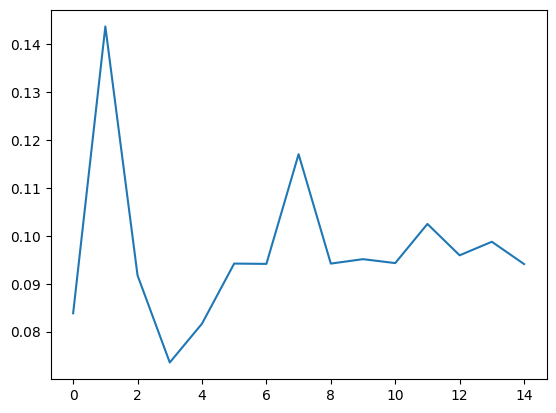

In [28]:
from tqdm import tqdm

errors = []
for mask_index in tqdm(range(true_bispectrum.shape[0])):
    predicted_geometry = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry, mask_index=mask_index)
    total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
    avg_point_distance_error = total_point_distance_error / len(predicted_geometry)
    errors.append(avg_point_distance_error)


step 0, loss: 6.067577350741484
step 100, loss: 0.0008156770478309522
step 200, loss: 0.00025511910920266074
step 300, loss: 0.0001310910613291352
step 400, loss: 6.857801771226321e-05
step 500, loss: 3.839199643383767e-05
step 600, loss: 2.368974014608428e-05
step 700, loss: 1.5716581475749627e-05
step 800, loss: 1.0933809929473398e-05
step 900, loss: 7.856366740280567e-06
step 1000, loss: 5.782194929108889e-06
step 1100, loss: 4.338462822045645e-06
step 1200, loss: 3.3088287410873866e-06
step 1300, loss: 2.5598444333652183e-06
step 1400, loss: 2.0056817162275523e-06
step 1500, loss: 1.5894552611447692e-06
step 1600, loss: 1.2725733316710856e-06
step 1700, loss: 1.0283427498261006e-06
step 1800, loss: 8.37985483550175e-07
step 1900, loss: 6.880890291107666e-07
step 2000, loss: 5.689388433401027e-07
step 2100, loss: 4.7340756327721636e-07
step 2200, loss: 3.96203056969058e-07
step 2300, loss: 3.3335185126998576e-07
step 2400, loss: 2.818394002273047e-07
Final best loss: 2.3974273198486

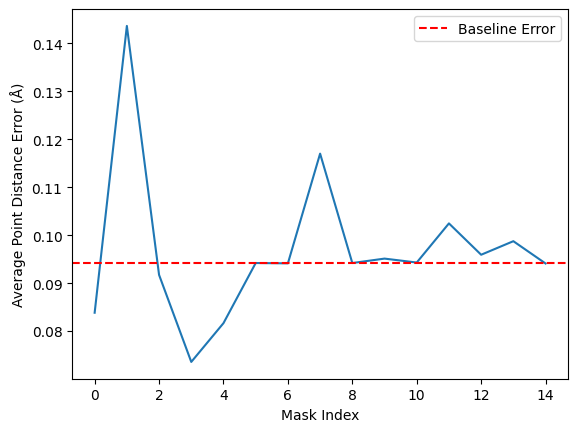

In [ ]:
predicted_geometry, _ = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry)

print("Computing point distance error")
total_point_distance_error, _ = point_distance(predicted_geometry, true_geometry)
baseline_error = total_point_distance_error / len(predicted_geometry)

plt.figure()
plt.plot(range(len(errors)), errors)
plt.axhline(y=baseline_error, color='r', linestyle='--', label='Baseline Error')
plt.title('Reconstruction Error vs Masked Bispectrum Component')
plt.xlabel('Mask Index')
plt.ylabel('Average Point Distance Error (Å)')
plt.legend()
plt.show()


### Reconstruction error vs num steps of grad descent with inversion

100


Final best loss: 0.0008329323272538299
Early stopping at iteration 505 due to no improvement for 100 iterations
200
Final best loss: 0.00025703021424822186
Early stopping at iteration 446 due to no improvement for 100 iterations
300
Final best loss: 0.00013194552239761178
Early stopping at iteration 451 due to no improvement for 100 iterations
400
Final best loss: 6.900997434504813e-05
Early stopping at iteration 328 due to no improvement for 100 iterations
500
Final best loss: 3.8595854718542686e-05
Early stopping at iteration 206 due to no improvement for 100 iterations
600
Final best loss: 2.3794668945102913e-05
Early stopping at iteration 121 due to no improvement for 100 iterations
700
Final best loss: 1.5776974810337285e-05
Early stopping at iteration 239 due to no improvement for 100 iterations
800
Final best loss: 1.0971599997719506e-05
Early stopping at iteration 303 due to no improvement for 100 iterations
900
Final best loss: 7.881362336102773e-06
Early stopping at iteration

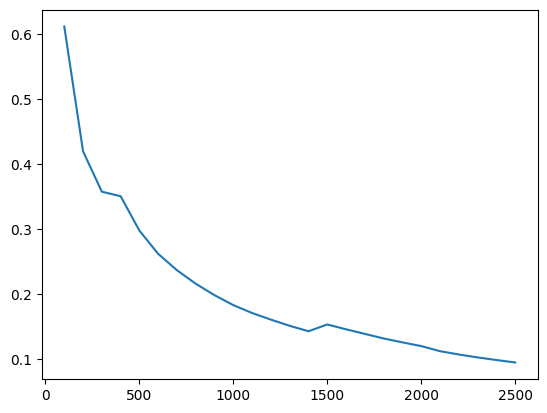

In [43]:
reconstruction_errors_vs_num_steps = {}
for num_iterations in range(100, 2600, 100):
    print(num_iterations)
    predicted_geometry = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry, num_iterations=num_iterations)
    total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
    avg_point_distance_error = total_point_distance_error / len(predicted_geometry)
    reconstruction_errors_vs_num_steps[num_iterations] = avg_point_distance_error

plt.plot(list(reconstruction_errors_vs_num_steps.keys()), list(reconstruction_errors_vs_num_steps.values()))
plt.show()


In [93]:
reconstruction_errors_vs_num_steps_v2 = {}
predicted_points, points_history = invert_to_points(true_bispectrum, bispectrum, lmax, num_iterations=2500)

step 0, loss: 6.067577350741484
step 50, loss: 0.004088942488653531
step 100, loss: 0.0008156770478309522
step 150, loss: 0.00039606704385768083
step 200, loss: 0.00025511910920266074
step 250, loss: 0.00018116250984866707
step 300, loss: 0.0001310910613291352
step 350, loss: 9.456439533501131e-05
step 400, loss: 6.857801771226321e-05
step 450, loss: 5.0669462507130846e-05
step 500, loss: 3.839199643383767e-05
step 550, loss: 2.9829151170268095e-05
step 600, loss: 2.368974014608428e-05
step 650, loss: 1.915612397976686e-05
step 700, loss: 1.5716581475749627e-05
step 750, loss: 1.304634562954463e-05
step 800, loss: 1.0933809929473398e-05
step 850, loss: 9.236724551574177e-06
step 900, loss: 7.856366740280567e-06
step 950, loss: 6.722139195971746e-06
step 1000, loss: 5.782194929108889e-06
step 1050, loss: 4.997579505165517e-06
step 1100, loss: 4.338462822045645e-06
step 1150, loss: 3.7816407178274717e-06
step 1200, loss: 3.3088287410873866e-06
step 1250, loss: 2.905464270058545e-06
step 

In [94]:
len(points_history)

50

0
Early stopping at iteration 463 due to no improvement for 100 iterations
50
Early stopping at iteration 540 due to no improvement for 100 iterations
100
Early stopping at iteration 396 due to no improvement for 100 iterations
150
Early stopping at iteration 493 due to no improvement for 100 iterations
200
Early stopping at iteration 274 due to no improvement for 100 iterations
250
Early stopping at iteration 378 due to no improvement for 100 iterations
300
Early stopping at iteration 170 due to no improvement for 100 iterations
350
Early stopping at iteration 462 due to no improvement for 100 iterations
400
Early stopping at iteration 236 due to no improvement for 100 iterations
450
Early stopping at iteration 496 due to no improvement for 100 iterations
500
Early stopping at iteration 260 due to no improvement for 100 iterations
550
Early stopping at iteration 193 due to no improvement for 100 iterations
600
Early stopping at iteration 398 due to no improvement for 100 iterations
65

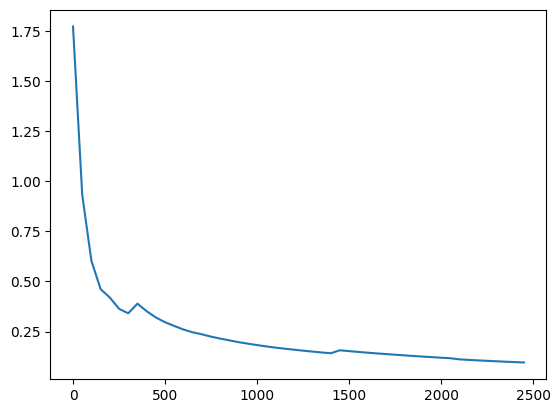

In [96]:
for num_iterations in range(0, 2500, 50):
    print(num_iterations)
    predicted_geometry = align_and_stack_points(points_history[num_iterations], true_geometry, lmax, seed=0, num_iterations=2500)
    total_point_distance_error, _ = point_distance(predicted_geometry, true_geometry)
    avg_point_distance_error = total_point_distance_error / len(predicted_geometry)
    reconstruction_errors_vs_num_steps_v2[num_iterations] = avg_point_distance_error

plt.plot(list(reconstruction_errors_vs_num_steps_v2.keys()), list(reconstruction_errors_vs_num_steps_v2.values()))
plt.show()

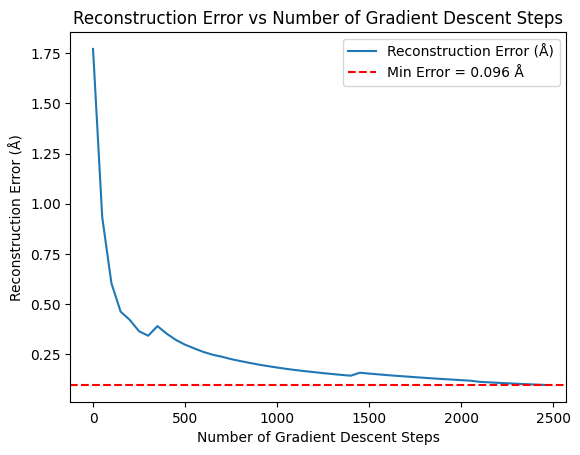

In [105]:
y_values = list(reconstruction_errors_vs_num_steps_v2.values())
x_values = list(reconstruction_errors_vs_num_steps_v2.keys())
plt.plot(x_values, y_values, label='Reconstruction Error (Å)')

min_y = min(y_values)
plt.axhline(y=min_y, color='red', linestyle='--', label=f'Min Error = {min_y:.3f} Å')

plt.title('Reconstruction Error vs Number of Gradient Descent Steps')
plt.xlabel('Number of Gradient Descent Steps')
plt.ylabel('Reconstruction Error (Å)')
plt.legend()
plt.show()

### Solid angle constrained inversion


In [75]:
import numpy as np
from scipy.spatial.transform import Rotation

def sample_solid_angle(n, omega, center_direction=None):
    """
    Efficiently sample n points uniformly on a unit sphere within a solid angle omega.
    
    Parameters:
    -----------
    n : int
        Number of points to sample.
    omega : float
        Solid angle in steradians (0 < omega <= 4*pi).
    center_direction : array-like, optional
        Direction vector specifying the center of the solid angle.
        If None, uses [0, 0, 1] (z-axis).
    
    Returns:
    --------
    points : ndarray
        Array of shape (n, 3) containing the sampled points on the unit sphere.
    """
    if omega <= 0 or omega > 4 * np.pi:
        raise ValueError("Solid angle must be in (0, 4π]")
    
    # Calculate the cap angle (half-angle of the cone)
    cap_angle = np.arccos(1 - omega / (2 * np.pi))
    
    # Set default center direction
    if center_direction is None:
        center_direction = np.array([0, 0, 1])
    else:
        center_direction = np.array(center_direction)
        center_direction = center_direction / np.linalg.norm(center_direction)
    
    # Generate points within the cap aligned with z-axis
    points = np.zeros((n, 3))
    
    for i in range(n):
        # Random azimuthal angle (φ)
        phi = 2 * np.pi * np.random.random()
        
        # For uniform distribution on sphere, we need to sample cos(θ) uniformly
        cos_theta = np.random.uniform(np.cos(cap_angle), 1)
        sin_theta = np.sqrt(1 - cos_theta**2)
        
        # Convert to Cartesian coordinates
        x = sin_theta * np.cos(phi)
        y = sin_theta * np.sin(phi)
        z = cos_theta
        
        points[i] = [x, y, z]
    
    # If the center direction is not along z-axis, rotate all points
    if not np.allclose(center_direction, [0, 0, 1]):
        # Find rotation from [0,0,1] to center_direction
        v1 = np.array([0, 0, 1])
        v2 = center_direction
        
        # Calculate rotation axis and angle
        rotation_axis = np.cross(v1, v2)
        if np.linalg.norm(rotation_axis) < 1e-10:
            # Special case: aligned with z-axis but possibly opposite direction
            if v2[2] < 0:  # Pointing in -z direction
                points = -points
        else:
            rotation_axis = rotation_axis / np.linalg.norm(rotation_axis)
            dot_product = np.dot(v1, v2)
            angle = np.arccos(np.clip(dot_product, -1.0, 1.0))
            
            # Create rotation object and apply to all points
            rot = Rotation.from_rotvec(rotation_axis * angle)
            points = rot.apply(points)
    
    return points

Final best loss: 6.408614690226399e-05
Early stopping at iteration 369 due to no improvement for 100 iterations
Final best loss: 6.32834507353955e-05
Early stopping at iteration 135 due to no improvement for 100 iterations
Final best loss: 6.302521046097523e-05
Early stopping at iteration 185 due to no improvement for 100 iterations
Final best loss: 1.498569817257808e-07
Early stopping at iteration 503 due to no improvement for 100 iterations
Stopping early at step 4569: no improvement for 100 iterations
Final best loss: 6.302521044134054e-05
Early stopping at iteration 335 due to no improvement for 100 iterations
Final best loss: 2.4222195543649538e-08
Early stopping at iteration 481 due to no improvement for 100 iterations
Final best loss: 6.160737603467132e-09
Early stopping at iteration 521 due to no improvement for 100 iterations
Stopping early at step 3447: no improvement for 100 iterations
Final best loss: 6.302521044134057e-05
Early stopping at iteration 361 due to no improveme

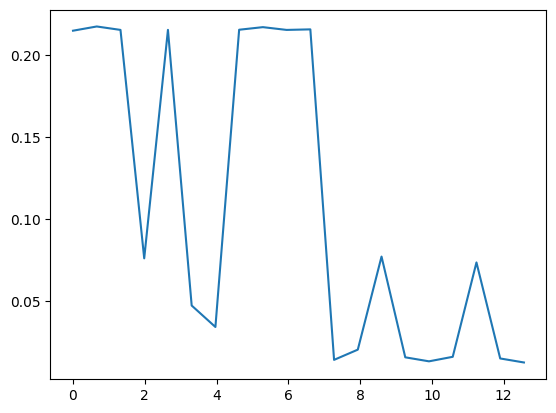

In [76]:
reconstruction_errors_vs_solid_angle = {}   
for solid_angle in np.linspace(0.001, 4*np.pi, 20):
    initial_points = sample_solid_angle(20, solid_angle)
    predicted_geometry = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry, num_iterations=5000, initial_points=initial_points)
    total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
    avg_point_distance_error = total_point_distance_error / len(predicted_geometry)
    reconstruction_errors_vs_solid_angle[solid_angle] = avg_point_distance_error

plt.plot(list(reconstruction_errors_vs_solid_angle.keys()), list(reconstruction_errors_vs_solid_angle.values()))

In [77]:
import numpy as np

def fibonacci_sphere(n):
    """
    Generate n points on a unit sphere that are approximately evenly distributed.
    
    Args:
        n (int): The number of points to generate.
        
    Returns:
        np.ndarray: Array of shape (n, 3) containing the (x, y, z) coordinates of the points.
    """
    points = np.zeros((n, 3))
    
    # Golden ratio calculation
    phi = (1 + np.sqrt(5)) / 2
    
    for i in range(n):
        # Generate evenly distributed points along the z-axis
        z = 1 - (2 * i + 1) / n
        
        # Calculate radius at height z
        r = np.sqrt(1 - z**2)
        
        # Use the golden angle to determine the position around the circle
        theta = 2 * np.pi * i / phi
        
        # Convert to Cartesian coordinates
        x = r * np.cos(theta)
        y = r * np.sin(theta)
        
        points[i] = [x, y, z]
    
    return points

In [107]:
initial_points = fibonacci_sphere(20)
predicted_geometry = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry, num_iterations=2500, initial_points=initial_points)
total_point_distance_error, _ = point_distance(predicted_geometry, true_geometry)
baseline = total_point_distance_error / len(predicted_geometry)

step 0, loss: 0.517503759833532
step 50, loss: 0.0001382044496544663
step 100, loss: 3.7200662071688832e-06
step 150, loss: 8.56554213209657e-07
step 200, loss: 3.728090230535616e-07
step 250, loss: 2.1017714574057545e-07
step 300, loss: 1.371077960645141e-07
step 350, loss: 9.806967003333572e-08
step 400, loss: 7.455508625404273e-08
step 450, loss: 5.9098804742672985e-08
step 500, loss: 4.82564399533913e-08
step 550, loss: 4.026727562460177e-08
step 600, loss: 3.415460805029514e-08
step 650, loss: 2.93390973840594e-08
step 700, loss: 2.5457361498680374e-08
step 750, loss: 2.22704918117613e-08
step 800, loss: 1.9615021147070768e-08
step 850, loss: 1.7375234789819875e-08
step 900, loss: 1.5466807565976113e-08
step 950, loss: 1.3826740609611715e-08
step 1000, loss: 1.2406950223270924e-08
step 1050, loss: 1.1170053261368563e-08
step 1100, loss: 1.008651777394139e-08
step 1150, loss: 9.132687718370576e-09
step 1200, loss: 8.289382428725318e-09
step 1250, loss: 7.540883298059378e-09
step 13

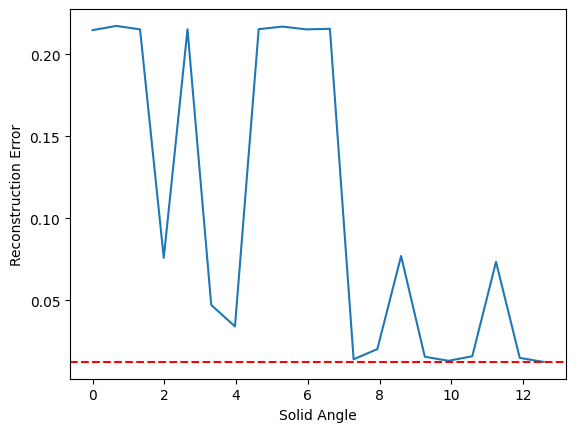

In [ ]:
plt.figure()
plt.plot(list(reconstruction_errors_vs_solid_angle.keys()), list(reconstruction_errors_vs_solid_angle.values()))
plt.xlabel('Solid Angle')
plt.ylabel('Reconstruction Error')
plt.show()


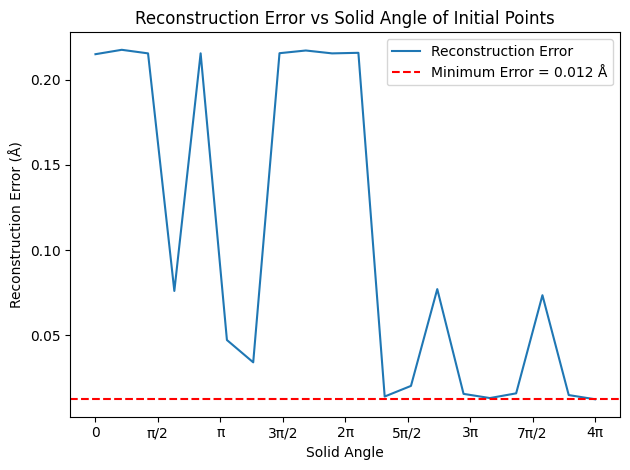

In [112]:
import matplotlib.pyplot as plt
import numpy as np

# Get data values
y_values = list(reconstruction_errors_vs_solid_angle.values())
min_error = min(y_values)

# Your original plotting command
plt.plot(list(reconstruction_errors_vs_solid_angle.keys()), y_values, label='Reconstruction Error')

# Add plot title and axis labels
plt.title('Reconstruction Error vs Solid Angle of Initial Points')
plt.xlabel('Solid Angle')
plt.ylabel('Reconstruction Error (Å)')

# Set custom x-axis ticks and labels
x_ticks = [0, np.pi/2, np.pi, 3*np.pi/2, 2*np.pi, 5*np.pi/2, 3*np.pi, 7*np.pi/2, 4*np.pi]
x_labels = ['0', 'π/2', 'π', '3π/2', '2π', '5π/2', '3π', '7π/2', '4π']
plt.xticks(x_ticks, x_labels)

plt.axhline(y=min_error, color='r', linestyle='--', label=f'Minimum Error = {min_error:.3f} Å')

plt.legend()
plt.tight_layout()
plt.show()

### Number of initial points

Stopping early at step 451: no improvement for 100 iterations
Final best loss: 0.004880197684374656
Early stopping at iteration 368 due to no improvement for 100 iterations
Stopping early at step 371: no improvement for 100 iterations
Final best loss: 0.004880197684374657
Early stopping at iteration 152 due to no improvement for 100 iterations
Stopping early at step 506: no improvement for 100 iterations
Final best loss: 0.0016489877654343298
Early stopping at iteration 185 due to no improvement for 100 iterations
Stopping early at step 545: no improvement for 100 iterations
Final best loss: 0.0003470403848261204
Early stopping at iteration 173 due to no improvement for 100 iterations
Stopping early at step 478: no improvement for 100 iterations
Final best loss: 0.0015782197675699803
Early stopping at iteration 254 due to no improvement for 100 iterations
Stopping early at step 513: no improvement for 100 iterations
Final best loss: 6.30252104413405e-05
Early stopping at iteration 216 

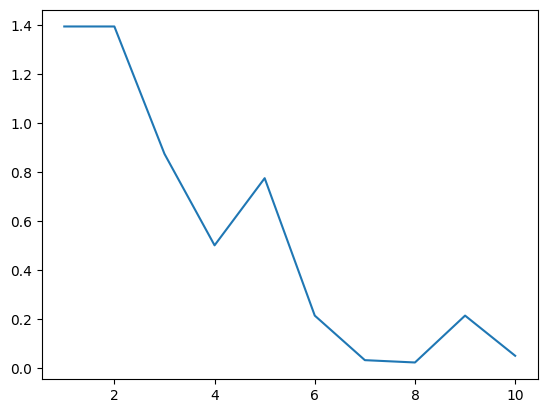

In [80]:
reconstruction_errors_vs_num_initial_points = {}
key = jax.random.PRNGKey(0)
for num_initial_points in range(1, 11):
    initial_points = jax.random.normal(key, (num_initial_points, 3))
    predicted_geometry = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry, num_iterations=2500, initial_points=initial_points)
    total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
    avg_point_distance_error = total_point_distance_error / len(predicted_geometry)
    reconstruction_errors_vs_num_initial_points[num_initial_points] = avg_point_distance_error

plt.plot(list(reconstruction_errors_vs_num_initial_points.keys()), list(reconstruction_errors_vs_num_initial_points.values()))
plt.show()

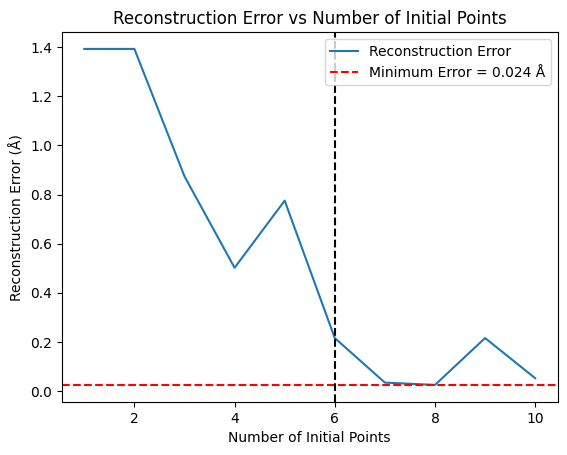

In [116]:
# Get data values
y_values = list(reconstruction_errors_vs_num_initial_points.values())
min_error = min(y_values)

plt.plot(list(reconstruction_errors_vs_num_initial_points.keys()), y_values, label='Reconstruction Error')
plt.axhline(y=min_error, color='r', linestyle='--', label=f'Minimum Error = {min_error:.3f} Å')
plt.axvline(x=6, color='k', linestyle='--')

plt.title('Reconstruction Error vs Number of Initial Points')
plt.xlabel('Number of Initial Points')
plt.ylabel('Reconstruction Error (Å)')
plt.legend()
plt.show()

### Rotation: number of random quaternions vs best alignment error

In [46]:
import jax
import jax.numpy as jnp
import e3nn_jax as e3nn
import optax


@jax.jit
def sample_uniform_quaternion(key):
    """Sample a uniform random quaternion using Arvo's method.
    
    Implements the algorithm from "Uniform Random Rotations" by James Arvo
    to generate uniformly distributed random quaternions representing 3D rotations.
    
    Args:
        key: JAX PRNG key for random number generation
    
    Returns:
        jnp.ndarray: A normalized quaternion as a 4D array [w, x, y, z] representing
            a random rotation
    """
    # Split the key for multiple random number generations
    key1, key2, key3 = jax.random.split(key, 3)
    
    # Sample three uniform random numbers in [0,1]
    u1 = jax.random.uniform(key1)
    u2 = jax.random.uniform(key2)
    u3 = jax.random.uniform(key3)
    
    # Convert to spherical coordinates
    sqrt1_minus_u1 = jnp.sqrt(1.0 - u1)
    sqrt_u1 = jnp.sqrt(u1)
    theta1 = 2.0 * jnp.pi * u2
    theta2 = 2.0 * jnp.pi * u3
    
    # Compute quaternion components
    w = sqrt1_minus_u1 * jnp.sin(theta1)
    x = sqrt1_minus_u1 * jnp.cos(theta1)
    y = sqrt_u1 * jnp.sin(theta2)
    z = sqrt_u1 * jnp.cos(theta2)
    
    return jnp.array([w, x, y, z])


def sample_multiple_quaternions(key, num_samples):
    """Sample multiple uniform random quaternions in parallel.
    
    Args:
        key: JAX PRNG key for random number generation
        num_samples: Number of quaternions to sample
    
    Returns:
        jnp.ndarray: Array of shape (num_samples, 4) containing the sampled quaternions,
            where each quaternion is represented as [w, x, y, z]
    """
    # Create multiple keys, one for each sample
    keys = jax.random.split(key, num_samples)
    
    # Use vmap to vectorize the sampling function across all keys
    sample_fn = jax.vmap(sample_uniform_quaternion)
    
    # Sample quaternions in parallel
    quaternions = sample_fn(keys)
    
    return quaternions


@jax.jit
def normalize_quaternion(q):
    """Normalize a quaternion to unit length.
    
    Args:
        q: Input quaternion as a 4D array [w, x, y, z]
    
    Returns:
        jnp.ndarray: Normalized quaternion with unit length
    """
    return q / jnp.linalg.norm(q)


@jax.jit
def signal_to_s2grid_vectors(signal):
    """Convert a spherical signal to grid vectors.
    
    Args:
        signal: Input spherical signal
        
    Returns:
        jnp.ndarray: Array of shape (N, 3) containing the grid vectors
    """
    signal_grid = e3nn.to_s2grid(signal, 30, 29, quadrature="soft")
    signal_vectors = signal_grid.grid_vectors * signal_grid.grid_values[..., None]
    signal_vectors = signal_vectors.reshape((-1, 3))
    return signal_vectors


@jax.jit
def spherical_harmonic_distance(signal1, signal2):
    return jnp.linalg.norm(signal1.array - signal2.array)


@jax.jit
def spherical_grid_distance(signal1, signal2):
    """Calculate the distance between two spherical signals.
    
    Computes the mean minimum squared Euclidean distance between the grid points
    of two spherical signals.
    
    Args:
        signal1: First spherical signal
        signal2: Second spherical signal
        
    Returns:
        float: Mean minimum squared distance between the signals
    """
    signal1_vectors = signal_to_s2grid_vectors(signal1)
    signal2_vectors = signal_to_s2grid_vectors(signal2)
    
    squared_distances = jnp.linalg.norm(
        signal1_vectors[:, None, :] - signal2_vectors[None, :, :], 
        axis=-1
    ) ** 2
    return jnp.mean(jnp.min(squared_distances, axis=-1))


@jax.jit
def loss_fn(quaternion, signal1, signal2):
    """Compute the alignment loss between two signals under a rotation.
    
    Args:
        quaternion: Rotation quaternion to apply to signal1
        signal1: First spherical signal to be rotated
        signal2: Second spherical signal (target)
        
    Returns:
        float: Distance between the rotated signal1 and signal2
    """
    rotated_signal1 = signal1.transform_by_quaternion(quaternion)
    return spherical_grid_distance(rotated_signal1, signal2)


def quaternion_errors(key, signal1, signal2, num_samples=100):
    """Find the best aligning quaternion from a random sample.
    
    Args:
        key: JAX PRNG key for random sampling
        signal1: First spherical signal to be rotated
        signal2: Second spherical signal (target)
        num_samples: Number of random quaternions to try
        
    Returns:
        jnp.ndarray: Best quaternion found from the random samples
    """
    quaternions = sample_multiple_quaternions(key, num_samples)
    return jnp.array([loss_fn(q, signal1, signal2) for q in quaternions])

In [60]:
keys = jax.random.split(jax.random.PRNGKey(0), 10)
all_errors = []
for key in keys:
    alignment_errors = quaternion_errors(key, true_signal, true_signal, num_samples=2500)
    all_errors.append(alignment_errors)
average_alignment_errors = jnp.mean(jnp.stack(all_errors), axis=0)
average_alignment_errors

Array([0.12529859, 0.14800579, 0.1229758 , ..., 0.12445459, 0.12973029,
       0.12519798], dtype=float64)

In [63]:
def min_so_far(arr):
    """
    Takes an array as input and returns a new array where each element is the minimum value
    encountered in the original array up to and including that index.
    
    Args:
        arr: A list of comparable elements (typically numbers)
        
    Returns:
        A list of the same length where each element is the minimum value up to that point
    
    Example:
        min_so_far([5, 3, 8, 2, 9, 1, 7]) -> [5, 3, 3, 2, 2, 1, 1]
    """
    if not arr:
        return []
    
    result = [0] * len(arr)
    current_min = arr[0]
    result[0] = current_min
    
    for i in range(1, len(arr)):
        current_min = min(current_min, arr[i])
        result[i] = current_min
        
    return result

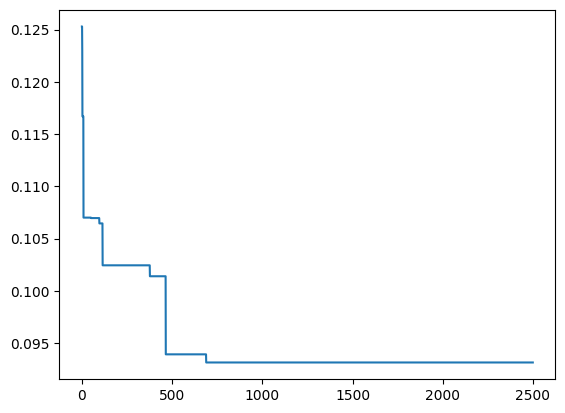

In [64]:
plt.plot(min_so_far(list(average_alignment_errors)))

In [65]:
import math

def rotation_quaternion(degrees, seed=None):
    """
    Returns a quaternion representing a rotation of the specified degrees
    about a random but deterministic axis when given a seed.
    
    Args:
        degrees (float): Rotation angle in degrees
        seed (int, optional): Random seed for deterministic axis generation
    
    Returns:
        numpy.ndarray: Quaternion in form [x, y, z, w]
    """
    # Set random seed for deterministic axis generation
    rng = np.random.RandomState(seed)
    
    # Generate a random unit vector for the rotation axis
    axis = rng.randn(3)
    axis = axis / np.linalg.norm(axis)  # Normalize to unit vector
    
    # Convert degrees to radians
    radians = math.radians(degrees)
    
    # Create rotation object
    rotation = Rotation.from_rotvec(axis * radians)
    
    # Get quaternion (scipy returns as [x, y, z, w])
    quat = rotation.as_quat()
    
    return quat

In [67]:

alignment_errors_vs_degree = {}
for degrees in [10, 20, 30]:
    q = rotation_quaternion(degrees)
    alignment_errors_vs_degree[degrees] = loss_fn(q, true_signal, true_signal)

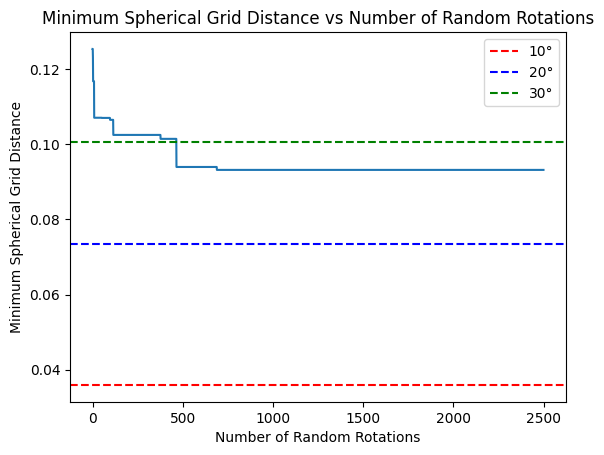

In [113]:
plt.plot(min_so_far(list(average_alignment_errors)))
colors = ['red', 'blue', 'green']
for (degrees, error), color in zip(alignment_errors_vs_degree.items(), colors):
    plt.axhline(y=error, color=color, linestyle='--', label=f'{degrees}°')

plt.title('Minimum Spherical Grid Distance vs Number of Random Rotations')
plt.xlabel('Number of Random Rotations')
plt.ylabel('Minimum Spherical Grid Distance')
plt.legend()

### rotation: recon error vs number of steps of quaternion gradient descent

In [14]:
reconstruction_errors_vs_alignment_steps = {}

predicted_points, _ = invert_to_points(true_bispectrum, bispectrum, lmax, num_iterations=2500)
predicted_points = stack_points(predicted_points)
predicted_signal = sum_of_diracs(predicted_points, lmax)
true_signal = sum_of_diracs(true_geometry, lmax) 
initial_quaternion = find_best_random_quaternion(key, predicted_signal, true_signal, num_samples=1000)

quaternion, _, quaternion_history = align_signals(predicted_signal, true_signal, initial_quaternion, num_iterations=2500)

step 0, loss: 6.067577350741484
step 50, loss: 0.004088942488653531
step 100, loss: 0.0008156770478309522
step 150, loss: 0.00039606704385768083
step 200, loss: 0.00025511910920266074
step 250, loss: 0.00018116250984866707
step 300, loss: 0.0001310910613291352
step 350, loss: 9.456439533501131e-05
step 400, loss: 6.857801771226321e-05
step 450, loss: 5.0669462507130846e-05
step 500, loss: 3.839199643383767e-05
step 550, loss: 2.9829151170268095e-05
step 600, loss: 2.368974014608428e-05
step 650, loss: 1.915612397976686e-05
step 700, loss: 1.5716581475749627e-05
step 750, loss: 1.304634562954463e-05
step 800, loss: 1.0933809929473398e-05
step 850, loss: 9.236724551574177e-06
step 900, loss: 7.856366740280567e-06
step 950, loss: 6.722139195971746e-06
step 1000, loss: 5.782194929108889e-06
step 1050, loss: 4.997579505165517e-06
step 1100, loss: 4.338462822045645e-06
step 1150, loss: 3.7816407178274717e-06
step 1200, loss: 3.3088287410873866e-06
step 1250, loss: 2.905464270058545e-06
step 

In [15]:
for num_iterations, quaternion in enumerate(quaternion_history):

    predicted_geometry = rotate_points_quaternion(quaternion, predicted_points)

    total_point_distance_error, _ = point_distance(predicted_geometry, true_geometry)
    avg_point_distance_error = total_point_distance_error / len(predicted_geometry)
    reconstruction_errors_vs_alignment_steps[num_iterations] = avg_point_distance_error


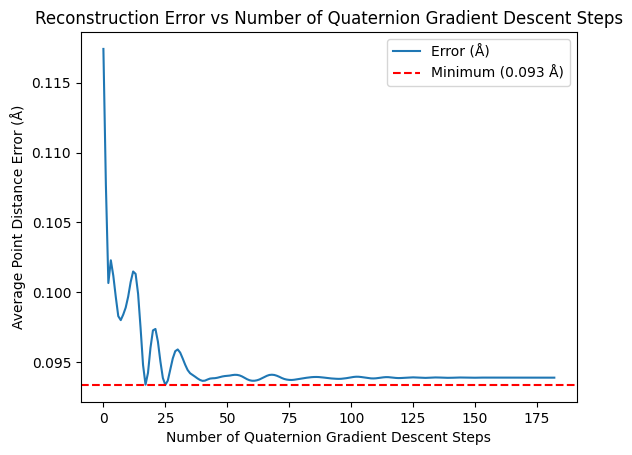

In [20]:
errors = list(reconstruction_errors_vs_alignment_steps.values())
min_error = min(errors)

plt.plot(list(reconstruction_errors_vs_alignment_steps.keys()), errors, label='Error (Å)')
plt.axhline(y=min_error, color='red', linestyle='--', label=f'Minimum ({min_error:.3f} Å)')
plt.title('Reconstruction Error vs Number of Quaternion Gradient Descent Steps')
plt.xlabel('Number of Quaternion Gradient Descent Steps')
plt.ylabel('Average Point Distance Error (Å)')
plt.legend()
plt.show()

### Error vs lmax

In [117]:
lmax = 4

true_geometry = octahedron


bis_reconstruction_errors_vs_lmax = {}
for lmax in range(2, 7):
    true_signal = sum_of_diracs(true_geometry, lmax)
    # true_power_spectrum = powerspectrum(true_signal)
    true_bispectrum = bispectrum(true_signal)
    predicted_geometry = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry, num_iterations=2500)
    total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
    avg_point_distance_error = total_point_distance_error / len(predicted_geometry)
    bis_reconstruction_errors_vs_lmax[lmax] = avg_point_distance_error

ps_reconstruction_errors_vs_lmax = {}
for lmax in range(2, 7):
    true_signal = sum_of_diracs(true_geometry, lmax)
    true_power_spectrum = powerspectrum(true_signal)
    # true_bispectrum = bispectrum(true_signal)
    predicted_geometry = reconstruct_geometry(true_bispectrum, bispectrum, lmax, true_geometry, num_iterations=2500)
    total_point_distance_error, max_point_distance_error = point_distance(predicted_geometry, true_geometry)
    avg_point_distance_error = total_point_distance_error / len(predicted_geometry)
    bis_reconstruction_errors_vs_lmax[lmax] = avg_point_distance_error


step 0, loss: 15.017005394868589
step 50, loss: 0.004777854546483461
step 100, loss: 0.0006840992648406042
step 150, loss: 0.00025418595034399613
step 200, loss: 0.00012480209450954234
step 250, loss: 7.28828818173197e-05
step 300, loss: 4.788347121658923e-05
step 350, loss: 3.3911741964395435e-05
step 400, loss: 2.5195562705721718e-05
step 450, loss: 1.9347034925653152e-05
step 500, loss: 1.522768403557995e-05
step 550, loss: 1.2223081589003052e-05
step 600, loss: 9.971336903755492e-06
step 650, loss: 8.246199897806709e-06
step 700, loss: 6.899887752844327e-06
step 750, loss: 5.832493537654652e-06
step 800, loss: 4.974548760208616e-06
step 850, loss: 4.27659255801901e-06
step 900, loss: 3.7026856654149976e-06
step 950, loss: 3.2262459198554126e-06
step 1000, loss: 2.8273008350565295e-06
step 1050, loss: 2.4906321483773566e-06
step 1100, loss: 2.2044968074322017e-06
step 1150, loss: 1.9597291272867994e-06
step 1200, loss: 1.749100157466462e-06
step 1250, loss: 1.5668537836028943e-06
st

AssertionError: [Chex] Assertion assert_equal_shape failed: Arrays have different shapes: [(35,), (5,)].

In [ ]:
lmax = 4

# true_geometry = degen1[1:]
# true_geometry = trigonal_plane
true_geometry = octahedron
true_signal = sum_of_diracs(true_geometry, lmax)
# true_power_spectrum = powerspectrum(true_signal)
true_bispectrum = bispectrum(true_signal)